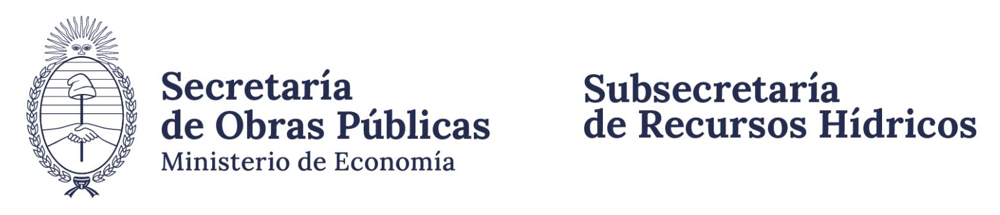

# **Introducción al procesamiento de datos de radar**

### Python:
Python es un lenguaje de programación ampliamente utilizado en las aplicaciones web, el desarrollo de software, la ciencia de datos y el machine learning (ML). Los desarrolladores utilizan Python porque es eficiente y fácil de aprender, además de que se puede ejecutar en muchas plataformas diferentes. El software Python se puede descargar gratis, se integra bien a todos los tipos de sistemas y aumenta la velocidad del desarrollo.

### Google Colab (Colaboratory):
Colaboratory, o "Colab" para abreviar, es un producto de Google Research. Permite a cualquier usuario escribir y ejecutar código arbitrario de Python en el navegador. Es especialmente adecuado para tareas de aprendizaje automático, análisis de datos y educación.

### Py-ART:
Py-ART es un módulo que consiste en un conjunto de herramientas y algoritmos, de acceso libre, para trabajar con datos de radares meteorológicos. Las mismas están basadas en el lenguaje de programación Python y son muy utilizadas por la comunidad de usuarios.


### Links útiles:
*   Qué es Python?: https://aws.amazon.com/es/what-is/python/
*   Google Colab: https://colab.research.google.com/?hl=es
*   Documentación Py-ART: https://py-art.readthedocs.io/en/latest/
*   Github: https://arm-doe.github.io/pyart/



### *Contacto: matias.suarez@unc.edu.ar*


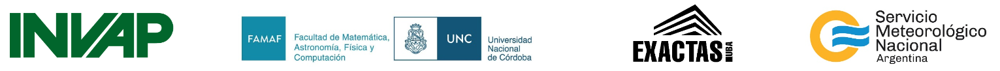

## **Primeramente se deben instalar las librerías específicas**

In [ ]:
# Instalamos arm_pyart y cartopy
!pip install cartopy
!pip install arm_pyart

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 88.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.2/117.2 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 49.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.8/301.8 kB 25.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.4/77.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.7/63.7 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 91.2 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.6.1
    Uninstalling fsspec-2024.6.1:
      Successfully 

## **Importamos las librerías**

<font color='green'>**Los comentarios (lineas que no son leidas en la ejecución) se indican con un # al principio**</font>

In [ ]:
# Importamos librerias necesarias para trabajar
import pyart                                                                # Libreria para trabajar con datos de radar PyART
import glob                                                                 # Expansión del patrón de nombres de ruta de estilo Unix (glob)
import matplotlib.pyplot as plt                                             # Libreria para graficar matplotlib
import cartopy.crs as ccrs                                                  # Libreria para graficar mapas georeferenciados (cartopy)
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import os                                                                   # Interfaces misceláneas del sistema operativo (os)
import sys                                                                  # Parámetros y funciones específicos del sistema (sys)
import numpy as np                                                          # cálculo numérico y el análisis de datos (numpy)
import warnings                                                             # Control de advertencias (warnings e ignore warnings)
warnings.filterwarnings('ignore')


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



## **Descargamos los archivos necesarios para trabajar**


*   Volumenes del radar RMA1
*   Shapefiles de la provincia de Córdoba
*   Modulos con funciones de python



In [ ]:
# Descargamos el modulo colores.py
!wget -O colores.py https://www.dropbox.com/scl/fi/x7rcbt2isepyoqkrvy7hb/colores.py?rlkey=endt973hpzggeadox6jzfmxyp&st=slva4n5p&dl=0
print('\n')

# Descargamos el modulo funciones_radar.py
!wget -O funciones_radar.py https://www.dropbox.com/scl/fi/dj1nsqbefb54toxotwp6j/funciones_radar.py?rlkey=hgh6ewv6bmtvs3a85r71hyrtc&st=f7h3jpry&dl=0
print('\n')

# Descargamos algunos datos de radar para trabajar
!wget -O Datos_Radar.zip https://www.dropbox.com/scl/fi/uhl3t2vpx9pw7m9qkxpav/Datos_Radar.zip?rlkey=h49t87qf8av7gjj727mm6ug6p&st=bbcapqck&dl=0
# !wget -O Datos_Radar.zip https://www.dropbox.com/scl/fi/2odzhj2peu9o3u7ejo4fx/dataset_1.zip?rlkey=il9p6519067ioxhvyujbilfw5&st=o35p7imj&dl=0
# !wget -O Datos_Radar.zip https://www.dropbox.com/scl/fi/953m42e3stjz95m9hxz26/dataset_2.zip?rlkey=lxo6qhsfibf297xigfwuiwwk4&st=qyq543d9&dl=0
print('\n')

# Descargamos shapefiles con los límites departamentales de Córdoba
!wget -O Shapes.zip https://www.dropbox.com/scl/fi/695odexr63ta88u4d896w/Shapes.zip?rlkey=wubfxltipp4ivmh0mawq7e462&st=uviug56h&dl=0

--2024-09-28 13:10:42--  https://www.dropbox.com/scl/fi/x7rcbt2isepyoqkrvy7hb/colores.py?rlkey=endt973hpzggeadox6jzfmxyp
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:6021:18::a27d:4112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ucd08d3df6d6ea0c2fc015bc7d39.dl.dropboxusercontent.com/cd/0/inline/CbaLdoVdZKL3bJX5leLEHsvYQ-jLMbhEXWhKmXSNajlrNcNvMvebYhYWo5GuCDZxmHWxbzGhvaGDEc1qoM5P366Vnzbf2RhtIlbcDgDiO9rNks3iXTmfdCadL_7BSuCNuuVDR0nOxv8six3ru2BJMhT0/file# [following]
--2024-09-28 13:10:43--  https://ucd08d3df6d6ea0c2fc015bc7d39.dl.dropboxusercontent.com/cd/0/inline/CbaLdoVdZKL3bJX5leLEHsvYQ-jLMbhEXWhKmXSNajlrNcNvMvebYhYWo5GuCDZxmHWxbzGhvaGDEc1qoM5P366Vnzbf2RhtIlbcDgDiO9rNks3iXTmfdCadL_7BSuCNuuVDR0nOxv8six3ru2BJMhT0/file
Resolving ucd08d3df6d6ea0c2fc015bc7d39.dl.dropboxusercontent.com (ucd08d3df6d6ea0c2fc015bc7d39.dl.dropboxusercontent.com)... 162.125.2.15, 2620:10

## **Descomprimimos los .zip descargados anteriormente**

In [ ]:
# unzip es la herramienta para descomprimir, -f permite forzar la escritura si el directorio existe
!rm -r Shapes && rm -r Datos_Radar # intentamos borrar directorios si es que existen
!unzip Shapes.zip
!unzip Datos_Radar.zip

rm: cannot remove 'Shapes': No such file or directory
Archive:  Shapes.zip
   creating: Shapes/
 extracting: Shapes/cba_deptos.cpg   
 extracting: Shapes/cba_deptos.dbf   
 extracting: Shapes/cba_deptos.prj   
 extracting: Shapes/cba_deptos.shp   
 extracting: Shapes/cba_deptos.shx   
Archive:  Datos_Radar.zip
   creating: Datos_Radar/
 extracting: Datos_Radar/RMA1_0303_01_20221209T233433Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221210T005132Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221209T235933Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221210T001231Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221210T003829Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221209T232132Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221209T230832Z.nc  
 extracting: Datos_Radar/RMA1_0303_01_20221210T002529Z.nc  


## **Cómo cargamos los datos desde nuestro Drive?**

## <font color='red'>**Si hemos descargado los datos anteriores no realizar este paso**</font>

### **Montamos nuestro drive para que podamos cargar los archivos que están allí (hacer click en conectar y luego permitir).**

In [ ]:
# # Cargamos nuestro drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Declaramos donde estan guardados los volumenes de radar
# dir_radar = "/content/drive/MyDrive/Curso-Radar/Datos_Radar"

# # Listamos todos los archivos en el directorio y los guardamos en una lista
# lista_de_archivos = sorted(glob.glob(dir_radar+'/*.nc'))
# lista_de_archivos

## **Indicamos al código donde están guardados los volumenes de radar**

In [ ]:
# Listamos todos los archivos en el directorio y los guardamos en una lista
lista_de_archivos = sorted(glob.glob('./Datos_Radar/*.nc'))
lista_de_archivos

['./Datos_Radar/RMA1_0303_01_20221209T230832Z.nc',
 './Datos_Radar/RMA1_0303_01_20221209T232132Z.nc',
 './Datos_Radar/RMA1_0303_01_20221209T233433Z.nc',
 './Datos_Radar/RMA1_0303_01_20221209T235933Z.nc',
 './Datos_Radar/RMA1_0303_01_20221210T001231Z.nc',
 './Datos_Radar/RMA1_0303_01_20221210T002529Z.nc',
 './Datos_Radar/RMA1_0303_01_20221210T003829Z.nc',
 './Datos_Radar/RMA1_0303_01_20221210T005132Z.nc']

In [ ]:
# Llamamos de la lista al primer elemento
lista_de_archivos[0]

'./Datos_Radar/RMA1_0303_01_20221209T230832Z.nc'

## **Lectura de un volumen de radar con la función *pyart.io.read***

Documentación: https://arm-doe.github.io/pyart/API/generated/pyart.io.read.html

In [ ]:
# Linea para la apertura del archivo o volumen de radar
radar = pyart.io.read(lista_de_archivos[0])

## **Visualización de las variables que hay dentro del volumen**

In [ ]:
# info del volumen de radar
radar.info()

altitude:
	data: <ndarray of type: float64 and shape: (1,)>
	long_name: altitud
	units: metros
	standard_name: Altitude
	positive: up
	possitive:: arriba
	_fillValue: -9999.0
altitude_agl: None
antenna_transition: None
azimuth:
	data: <ndarray of type: float32 and shape: (5400,)>
	long_name: azimuth_angle_from_true_north
	units: degrees
	standard_name: beam_azimuth_angle
	axis: radial_azimuth_coordinate
	comment: Azimuth of antenna relative to true north
elevation:
	data: <ndarray of type: float32 and shape: (5400,)>
	long_name: elevation_angle_from_horizontal_plane
	units: degrees
	standard_name: beam_elevation_angle
	axis: radial_elevation_coordinate
	comment: Elevation of antenna relative to the horizontal plane
fields:
	WRAD:
		data: <ndarray of type: float32 and shape: (5400, 523)>
		units: m/s
	KDP:
		data: <ndarray of type: float32 and shape: (5400, 523)>
		units: deg/km
	DBZV:
		data: <ndarray of type: float32 and shape: (5400, 523)>
		units: dBZ
	DBZH:
		data: <ndarray of type

In [ ]:
# Visualizamos las variables disponibles en el volumen de radar (keys)
radar.fields.keys()

dict_keys(['WRAD', 'KDP', 'DBZV', 'DBZH', 'ZDR', 'VRAD', 'RHOHV', 'PHIDP'])

In [ ]:
# Visualizamos como es la matriz de datos de una variable en particular
radar.fields['DBZH']

{'units': 'dBZ',
 'data': masked_array(
   data=[[3.0844595432281494, 41.95598220825195, 16.655385971069336, ...,
          --, --, --],
         [--, --, --, ..., --, --, --],
         [--, 33.815799713134766, 20.344900131225586, ..., --, --, --],
         ...,
         [-10.420018196105957, -14.847013473510742, -16.400623321533203,
          ..., --, --, --],
         [-7.288841724395752, -12.622234344482422, -17.768041610717773,
          ..., --, --, --],
         [-6.757976531982422, -3.796635389328003, -14.322991371154785,
          ..., --, --, --]],
   mask=[[False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True]],
   fill_value=9.96921e+36,
   dtype=float32)}

## **Podemos ver también que información tiene este volumen**

## **Graficos de las variables que tiene el volumen**


In [ ]:
# Importamos mapa de colores personalizados diseñados por el Grupo Radar Córdoba (@GrupoRadarCBA en Twitter/X)
# Si los archivos están en nuestro drive ejecutar esta parte para indicarle a python donde encontrar el modulo colores.py

# *************************************************************
# py_file_location = "/content/drive/MyDrive/Curso-Radar"
# sys.path.append(os.path.abspath(py_file_location))
# *************************************************************

# Colormaps del GRC
import colores

## **Patrón de elevación del radar**
Debido a la curvatura terrestre y a efectos de refracción en la atmósfera, el patrón volumétrico del radar meteorológico tiene el siguiente aspecto:

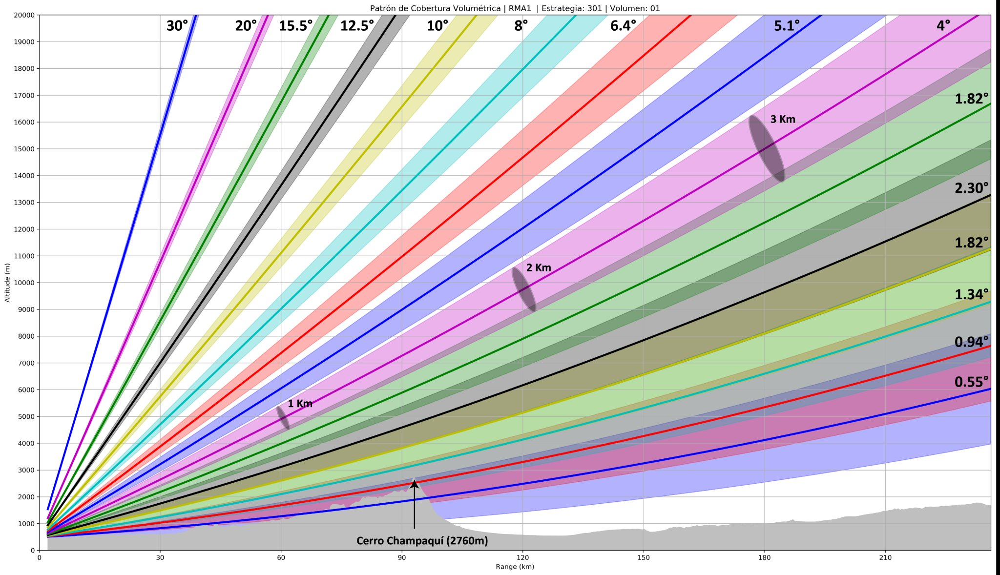

## **Gráfico simple del factor de reflectividad DBZH**

Documentación: https://arm-doe.github.io/pyart/API/generated/pyart.graph.RadarMapDisplay.plot_ppi_map.html

Más colormaps en https://github.com/jjhelmus/pyart_colormaps_and_limits.git

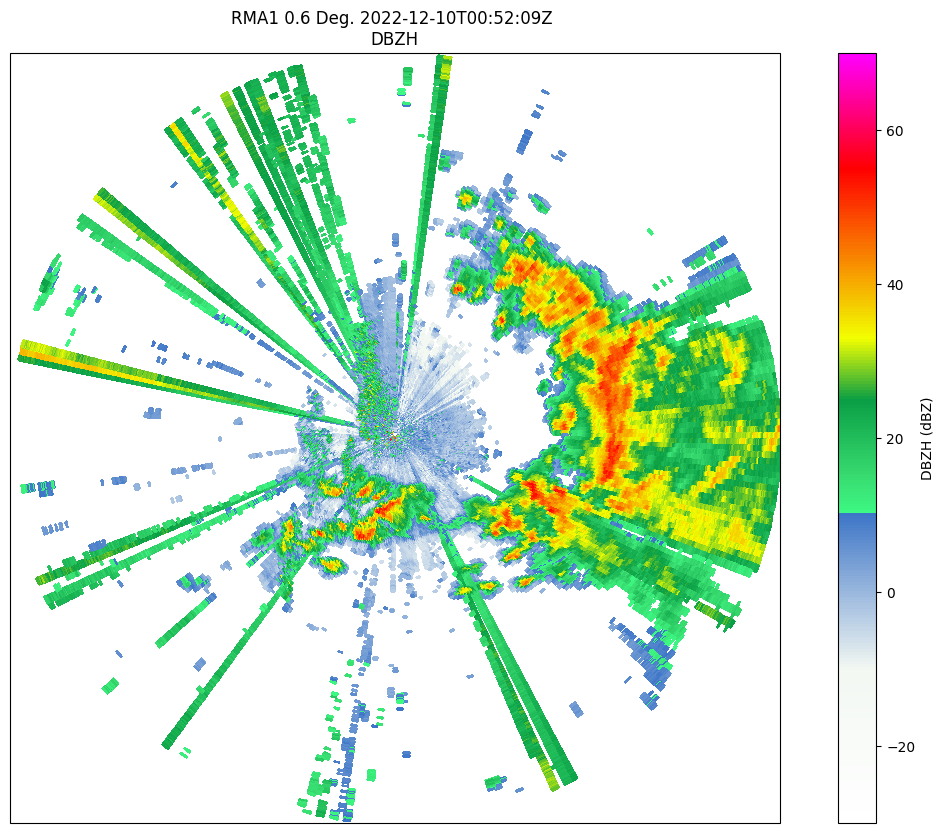

In [ ]:
# Creamos objeto figura y le asignamos un tamaño
fig = plt.figure(figsize=(15,10))
# Creamos un objeto display con los datos del volumen
display = pyart.graph.RadarMapDisplay(radar)

# Definimos la proyección con la que vamos a graficar
projection = ccrs.Mercator() # Alternativamente podemos usar PlateCarree

# Grafico de DBZH
ax1 = plt.subplot(1, 1, 1, projection=projection)
display.plot_ppi_map(field='DBZH', sweep=0, vmin = -30, vmax = 70,
                    cmap='grc_th', ax=ax1,       # pyart_NWSRef o grc_th, si usamos pyart_NWSRef es recomendable usar vmin = 0, vmax = 70
                    projection=projection)

## **Se agregan límites departamentales a la figura anterior**

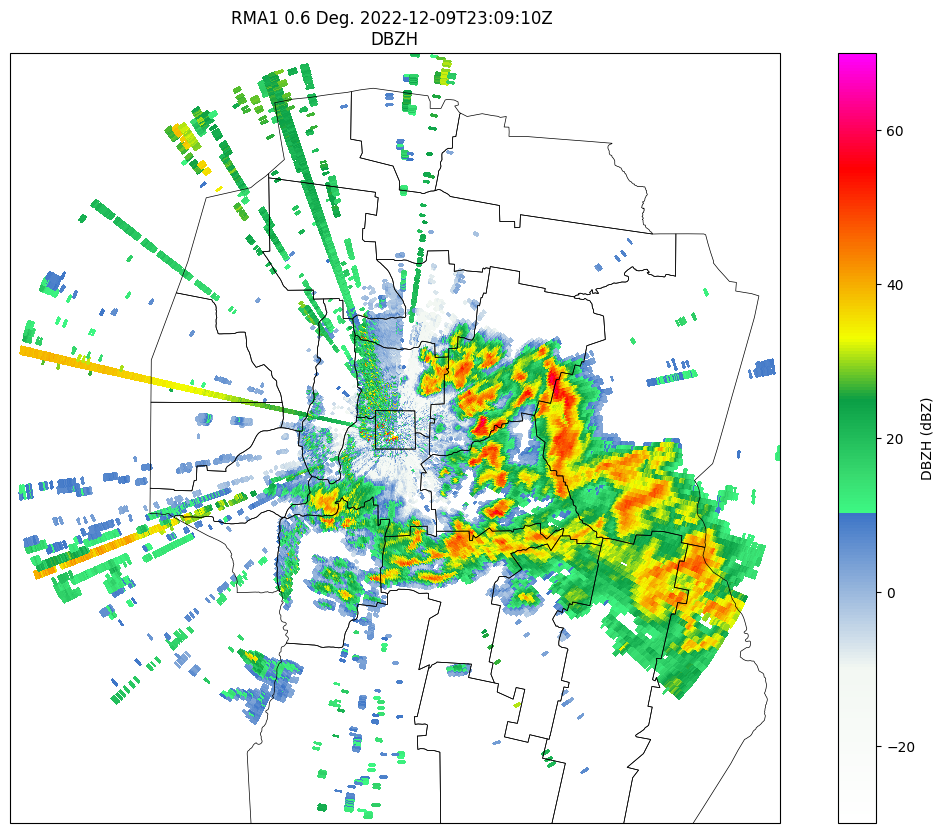

In [ ]:
# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'

shapes_kwargs = {'zorder':1,'facecolor':'None', 'edgecolor':'black', 'alpha':1,'lw':.5}

# Creamos objeto figura y le asignamos un tamaño
fig = plt.figure(figsize=(15,10))
# Creamos un objeto display con los datos del volumen
display = pyart.graph.RadarMapDisplay(radar)

# Definimos la proyección con la que vamos a graficar
projection = ccrs.Mercator() #PlateCarree

# Grafico de DBZH
ax1 = plt.subplot(1, 1, 1, projection=projection)
display.plot_ppi_map(field='DBZH', sweep=0, vmin = -30, vmax = 70,
                     cmap='grc_th', ax=ax1,
                     projection=projection,
                     shapefile=path_shapes,
                     shapefile_kwargs=shapes_kwargs)

## **Figura de cada archivo de radar**

In [ ]:
contador = 0

# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'

shapes_kwargs = {'zorder':1,'facecolor':'None', 'edgecolor':'black', 'alpha':1,'lw':.5}
projection = ccrs.Mercator() #PlateCarree

# Limpiamos el directorio por si llega a haber figuras de ejecuciones anteriores
!rm *.png

for filename in lista_de_archivos:
  # Comando de lectura
  radar = pyart.io.read(filename)
  # Creamos objeto figura y le asignamos un tamaño
  fig = plt.figure(figsize=(15,10))
  # Creamos un objeto display con los datos del volumen
  display = pyart.graph.RadarMapDisplay(radar)

  # Definimos la proyección con la que vamos a graficar
  projection = ccrs.Mercator() #PlateCarree

  # Grafico de DBZH
  ax1 = plt.subplot(1, 1, 1, projection=projection)
  display.plot_ppi_map(field='DBZH', sweep=0, vmin = -30, vmax = 70,
                      cmap='grc_th', ax=ax1,
                      projection=projection,
                      shapefile=path_shapes,
                      shapefile_kwargs=shapes_kwargs)
  # Guardamos la figura
  plt.savefig('figura_'+str(contador)+'.png', bbox_inches='tight', dpi=100)
  plt.show()

  contador = contador + 1

Output hidden; open in https://colab.research.google.com to view.

## **Animación**


In [ ]:
# Creamos una lista vacia para guardar nuestras figuras
lista_figuras = []
# Listamos todos los archivos en el directorio temporal de colab
lista_archivos = os.listdir()
# Iteramos por cada archivo y verificamos que termine en .png
for archivo in lista_archivos:
  if archivo.split('.')[-1] == 'png':
    lista_figuras.append(archivo)

# Ordenamos la lista
lista_figuras.sort()
lista_figuras

['figura_0.png',
 'figura_1.png',
 'figura_2.png',
 'figura_3.png',
 'figura_4.png',
 'figura_5.png',
 'figura_6.png',
 'figura_7.png']

In [ ]:
# Extraido del repositorio de Diego Souza (https://github.com/diegormsouza)
# Interfaz de Python para leer y escribir imagenes
import imageio.v2 as imageio
from IPython.display import Image

# Creamos el .GIF
images = []
for figura in lista_figuras:
    images.append(imageio.imread(figura))
imageio.mimsave('animacion.gif', images, fps=1)

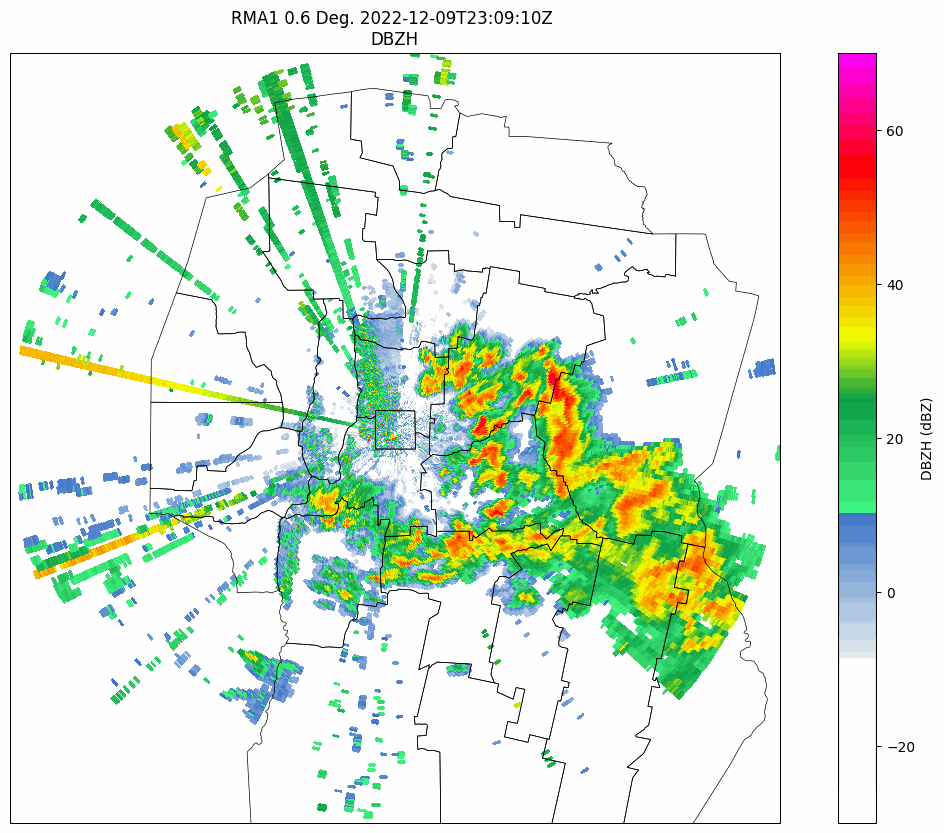

In [ ]:
# Abrimos el .GIF
Image(open('animacion.gif','rb').read())

## **Gráfico de DBZH, ZDR, RHOHV y KDP**

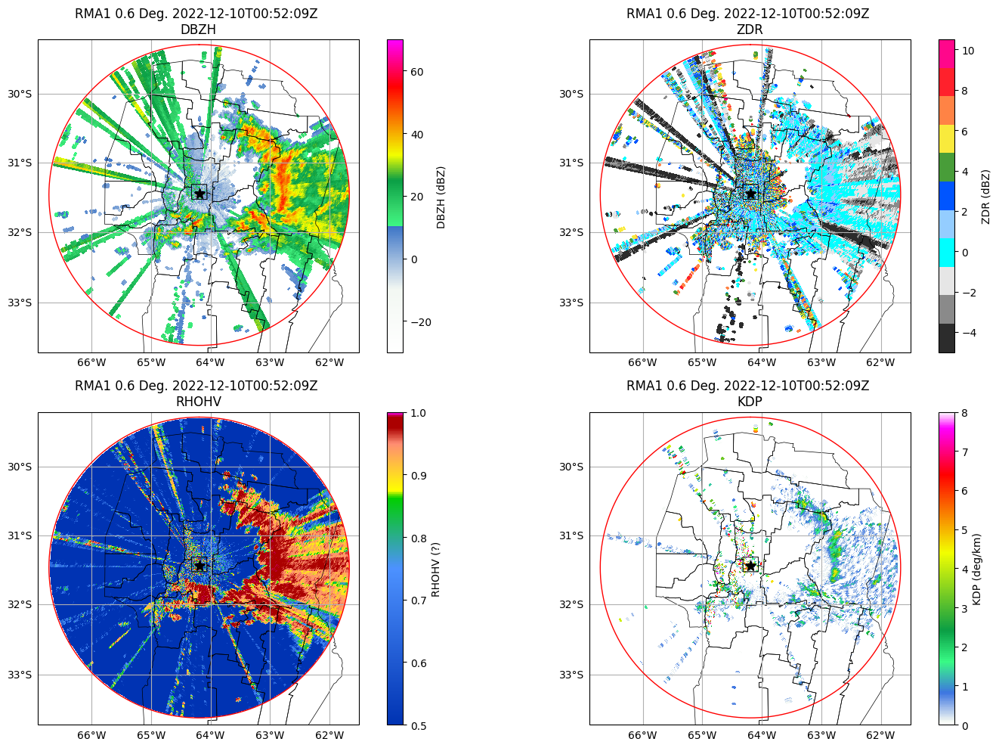

In [ ]:
##########################################################################################################################
##########################################################################################################################
# Elevacion de la antena que queremos graficar
elevacion = 0

# Configuramos ventana de visualizacion
min_lon=-66.9
max_lon=-61.5
min_lat=-33.7
max_lat=-29.2

#min_lon=-63.8
#max_lon=-62.7
#min_lat=-31.7
#max_lat=-30.8
##########################################################################################################################
##########################################################################################################################

fig = plt.figure(figsize=(15,10))
display = pyart.graph.RadarMapDisplay(radar)

fig.patch.set_visible(False)

# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'

shapes_kwargs = {'zorder':1,'facecolor':'None', 'edgecolor':'black', 'alpha':1,'lw':.5}
projection = ccrs.Mercator() #PlateCarree

# Grafico de DBZH
         #(filas, columnas, elemento)
ax1 = plt.subplot(2, 2, 1, projection=projection)
display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# display.plot_point(-63.571418834631224, -32.04548956046992, '.', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

# Grafico de ZDR
ax2 = plt.subplot(2, 2, 2, projection=projection)
display.plot_ppi_map('ZDR', elevacion, vmin = -5, vmax = 10.5, cmap='grc_zdr', ax=ax2,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

# Grafico de RHOHV
ax3 = plt.subplot(2, 2, 3, projection=projection)
display.plot_ppi_map('RHOHV', elevacion, vmin = 0.5, vmax = 1, cmap='grc_rho', ax=ax3,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

# Grafico de KDP
ax4 = plt.subplot(2, 2, 4, projection=projection)
display.plot_ppi_map('KDP', elevacion, vmin = 0, vmax = 8, cmap='grc_rain', fig=fig, ax=ax4,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

plt.tight_layout()
#plt.savefig('/content/drive/MyDrive/Curso_Radar_UNC-FaMAF/PPIx4.png', dpi=150, transparent=False)
plt.show()

## **Aplicación de filtros basados en RHOHV a la variable DBZH**
Intentaremos graficar sólo aquellos valores de DBZH asociados a RHOHV mayores a un dado umbral

Documentación: https://arm-doe.github.io/pyart/API/generated/pyart.filters.GateFilter.html

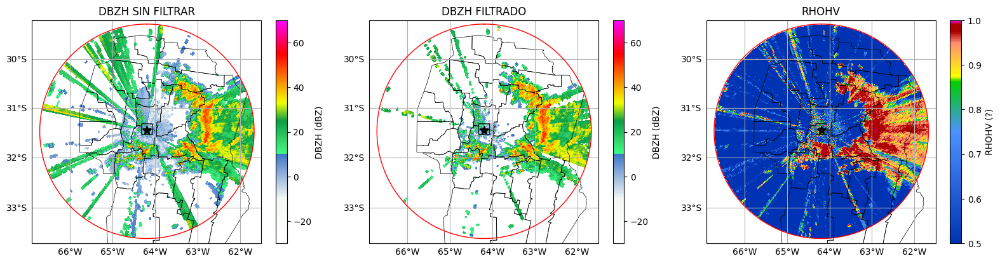

In [ ]:
##########################################################################################################################
##########################################################################################################################
# Elevacion de la antena que queremos graficar
elevacion = 0

# Configuramos ventana de visualizacion
min_lon=-66.9
max_lon=-61.5
min_lat=-33.7
max_lat=-29.2

# Filtro. Extraido de las notebooks de Ignacio Montamat (Grupo Radar Córdoba).
gf = pyart.correct.GateFilter(radar)
gf.exclude_below('RHOHV', 0.92)

##########################################################################################################################
##########################################################################################################################

fig = plt.figure(figsize=(16,4))
display = pyart.graph.RadarMapDisplay(radar)

fig.patch.set_visible(False)

# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'

shapes_kwargs = {'zorder':1,'facecolor':'None', 'edgecolor':'black', 'alpha':1,'lw':.5}
projection = ccrs.Mercator() #PlateCarree

# Grafico de DBZH sin filtrar
         #(filas, columnas, elemento)
ax1 = plt.subplot(1, 3, 1, projection=projection)
display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat,
                     title='DBZH SIN FILTRAR')
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# display.plot_point(-63.571418834631224, -32.04548956046992, '.', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

# Grafico de DBZH filtrado
         #(filas, columnas, elemento)
ax1 = plt.subplot(1, 3, 2, projection=projection)
display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat, gatefilter=gf,
                     title='DBZH FILTRADO')
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# display.plot_point(-63.571418834631224, -32.04548956046992, '.', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

# Grafico de RHOHV
ax2 = plt.subplot(1, 3, 3, projection=projection)
display.plot_ppi_map('RHOHV', elevacion, vmin = 0.5, vmax = 1, cmap='grc_rho', ax=ax2,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66], # paralelos y meridianos para agregar al mapa
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat,
                     title='RHOHV')
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')

plt.tight_layout()
#plt.savefig('/content/drive/MyDrive/Curso_Radar_UNC-FaMAF/PPIx4.png', dpi=150, transparent=False)
plt.show()

## **Grafico de un corte pseudo radial**

Documentación: https://arm-doe.github.io/pyart-docs-travis/API/generated/pyart.util.cross_section_ppi.html

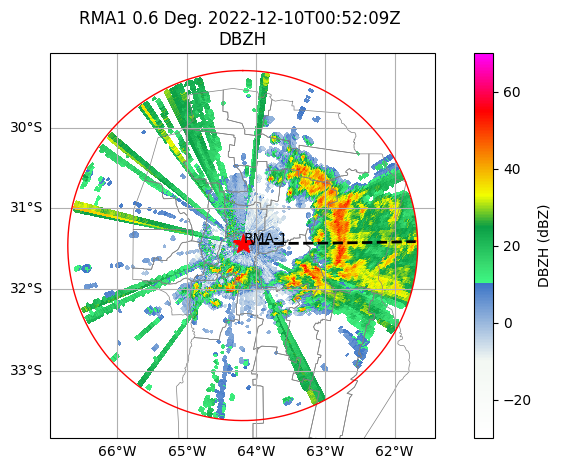

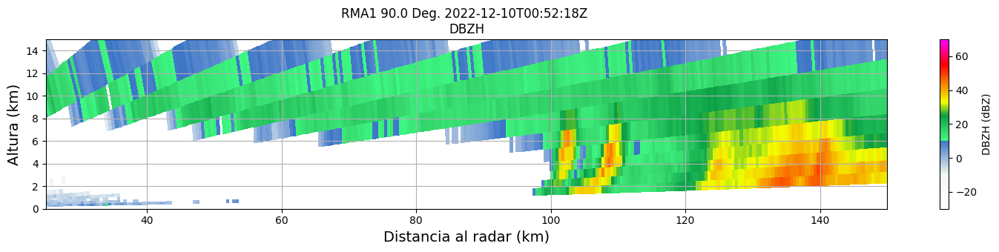

In [ ]:
##########################################################################################################################
##########################################################################################################################

# Definimos el radial de interés (de 0 a 360 grados contando desde el norte en sentido horario)
radial = 90

# Definimos la elevación de antena que queremos graficar
elevacion = 0

# Configuramos limites distancia al radar (xlim) y altura (ylim) en km
xlim = [25,150]
ylim = [0,15]

##########################################################################################################################
##########################################################################################################################
# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'

projection = ccrs.Mercator() #PlateCarree

# Extraido de las notebooks de Maite Cancelada (UBA-DCAO)
# Extraemos la información necesaria para graficar una línea radial sobre el PPI
indice_inicial = radar.sweep_start_ray_index['data'][elevacion]
indice_final   = radar.sweep_end_ray_index['data'][elevacion]
# Extraemos los azimuths para la elevación indicada (p ej. para elevacion 0 devuelve 0,1,...,358,359)
azimuths = radar.azimuth['data'][indice_inicial:indice_final]
# Buscamos el índice del azimuth más cercano al radial requerido
indice_aximuth = np.argmin(np.abs(azimuths-radial))
# Extraemos las latitudes y longitudes de los puntos
lat_azimuth, lon_azimuth, altitud = radar.get_gate_lat_lon_alt(elevacion)

# Abrimos una nueva figura
fig = plt.figure(figsize=(10,5))
ax1 = plt.subplot(1, 1, 1, projection=projection)

display = pyart.graph.RadarMapDisplay(radar)
# Graficamos el PPI
display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', projection=projection, ax=ax1, lat_0=radar.latitude['data'][0],
                     lon_0=radar.longitude['data'][0], lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66],
                     shapefile=path_shapes, shapefile_kwargs={'zorder':1,'facecolor':'None', 'edgecolor':'grey', 'alpha':1,'lw':.5}
                     )
# Graficamos una línea en el radial indicado
display.plot_line_geo(lon_azimuth[indice_aximuth,:], lat_azimuth[indice_aximuth,:], 'k--', lw=2)
# Graficamos un punto en la ubicación del radar
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0],'r*', 'RMA-1',ms=15)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([240], ax=None, lw=1, col='red')
################################################################################################

# Se realiza grafico del radial
xsect = pyart.util.cross_section_ppi(radar, [radial])

display = pyart.graph.RadarDisplay(xsect)

fig = plt.figure(figsize=[15,3.5])

ax2 = plt.subplot(1, 1, 1)
display.plot('DBZH', 0, vmin=-30, vmax=70, cmap='grc_th', ax=ax2)
display.set_limits(xlim=xlim, ylim=ylim)
plt.xlabel('Distancia al radar (km)', fontsize=14)
plt.ylabel('Altura (km)', fontsize=14)
plt.grid()

plt.tight_layout()
plt.show()

## **Animación a partir del corte radial**

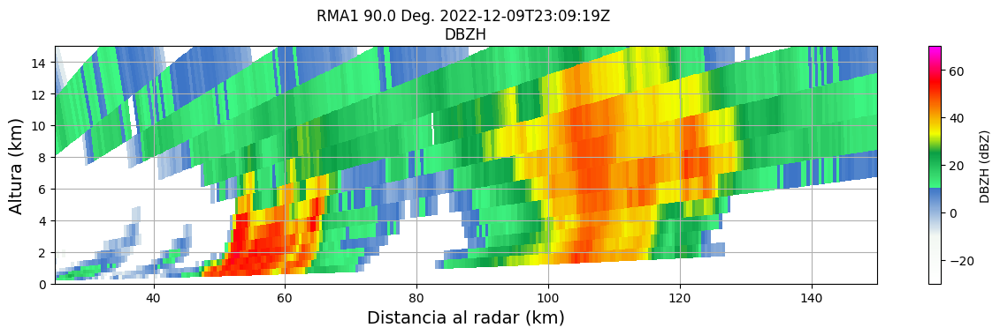

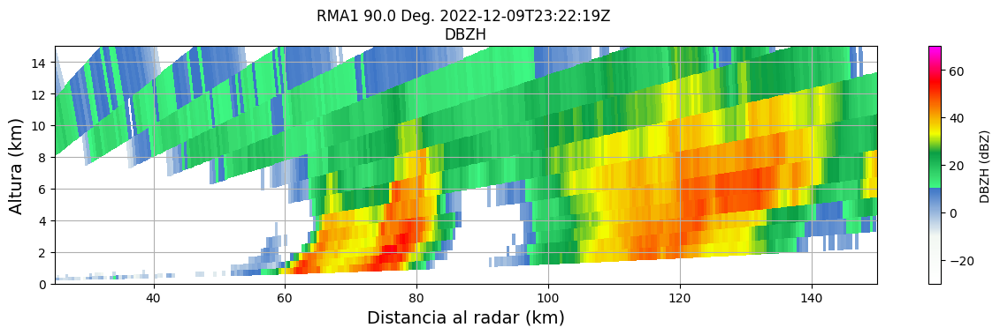

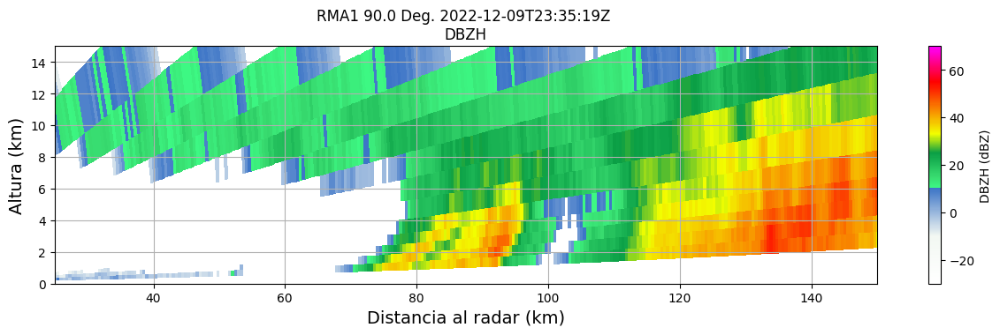

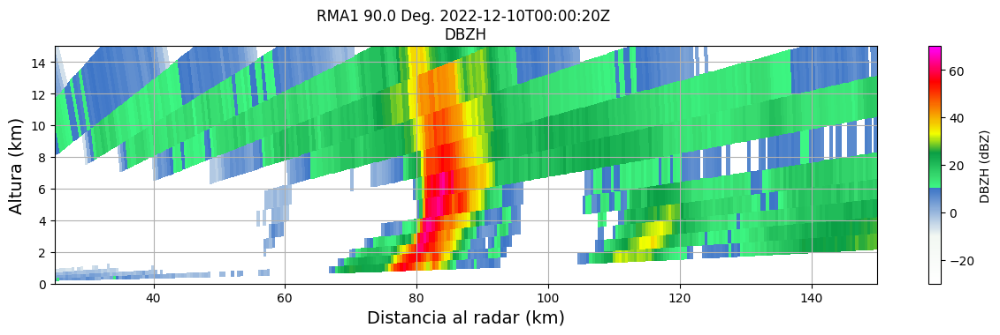

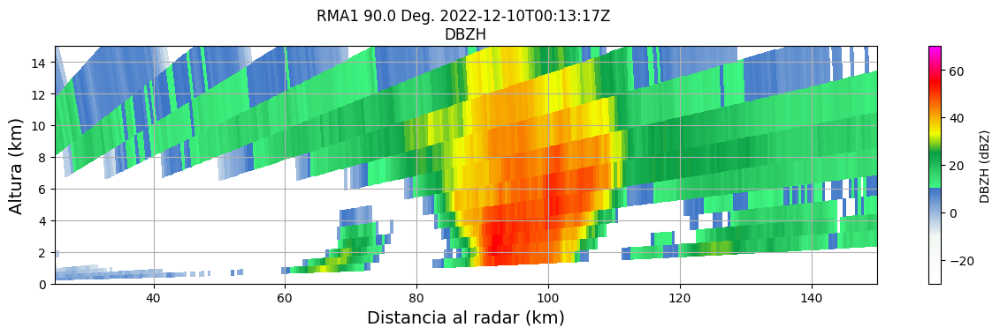

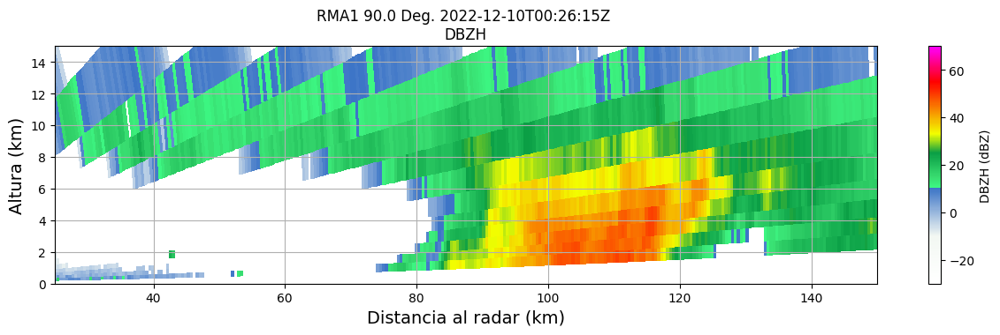

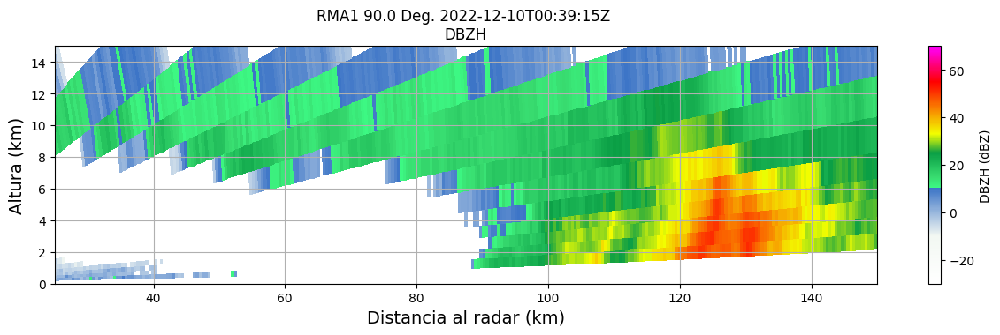

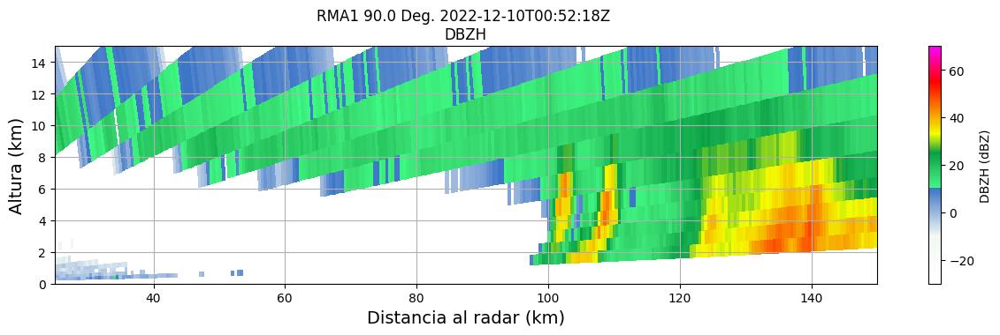

In [ ]:
##########################################################################################################################
##########################################################################################################################

# Definimos el radial de interés (de 0 a 360 grados contando desde el norte en sentido horario)
radial = 90

# Definimos la elevación de antena que queremos graficar
elevacion = 0

# Configuramos limites distancia al radar (xlim) y altura (ylim) en km
xlim = [25,150]
ylim = [0,15]

##########################################################################################################################
##########################################################################################################################

# Limpiamos el directorio por si llega a haber figuras de ejecuciones anteriores
!rm *.png

projection = ccrs.Mercator() #PlateCarree

contador = 0
for filename in lista_de_archivos:

  # Comando de lectura
  radar = pyart.io.read(filename)
  # Se realiza grafico del radial
  xsect = pyart.util.cross_section_ppi(radar, [radial])

  display = pyart.graph.RadarDisplay(xsect)

  fig = plt.figure(figsize=[15,3.5])

  ax2 = plt.subplot(1, 1, 1)
  display.plot('DBZH', 0, vmin=-30, vmax=70, cmap='grc_th', ax=ax2)
  display.set_limits(xlim=xlim, ylim=ylim)
  plt.xlabel('Distancia al radar (km)', fontsize=14)
  plt.ylabel('Altura (km)', fontsize=14)
  plt.grid()
  # Guardamos la figura
  plt.savefig('figura_'+str(contador)+'.png', bbox_inches='tight', dpi=100)

  contador = contador + 1

In [ ]:
# creamos una lista vacia para guardar nuestras figuras
lista_figuras = []
# listamos todos los archivos en el directorio temporal de colab
lista_archivos = os.listdir()
# iteramos por cada archivo y verificamos que termine en .png
for archivo in lista_archivos:
  if archivo.split('.')[-1] == 'png':
    lista_figuras.append(archivo)

# ordenamos la lista
lista_figuras.sort()
lista_figuras

['figura_0.png',
 'figura_1.png',
 'figura_2.png',
 'figura_3.png',
 'figura_4.png',
 'figura_5.png',
 'figura_6.png',
 'figura_7.png']

In [ ]:
# Interfaz de Python para leer y escribir imagenes
import imageio.v2 as imageio
from IPython.display import Image

# Creamos el .GIF
images = []
for figura in lista_figuras:
    images.append(imageio.imread(figura))
imageio.mimsave('animacion.gif', images, fps=1)

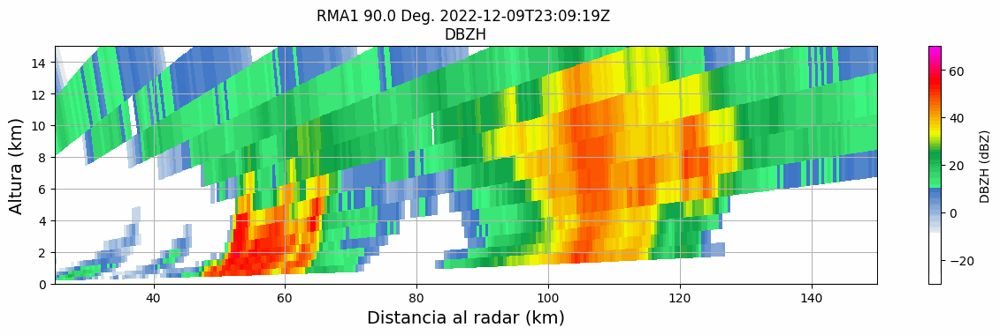

In [ ]:
# Abrimos el .GIF
Image(open('animacion.gif','rb').read())

## **Grafico de 3 paneles con los cortes latitudinal y longitudinal del volumen de radar**

Es necesario crear una grilla para poder realizar estos cortes.

Documentación: https://arm-doe.github.io/pyart/examples/plotting/plot_three_panel_gridmapdisplay.html

In [ ]:
# Comando de lectura
radar = pyart.io.read(lista_de_archivos[0])

# Creamos un filtro
gf = pyart.correct.GateFilter(radar)
gf.exclude_below('RHOHV', 0.9)

# Definimos la proyección con la que vamos a graficar
projection = ccrs.Mercator() #PlateCarree
# Definimos los limites de nuestra grilla en las 3 dimensiones (x,y,z)
z_grid_limits = (500,15e3)
y_grid_limits = (-200e3,200e3)
x_grid_limits = (-200e3,200e3)
# Definimos una resolución. A mayor resolución más lento va a ser el procesamiento de la grilla.
grid_resolution = 1000
# Definimos una función que nos calcule el numéro de puntos en las 3 dimensiones
def compute_number_of_points(extent, resolution):
    return int((extent[1] - extent[0])/resolution)
# Aplicamos la función anterior y calculamos el numero de puntos en cada dirección
z_grid_points = compute_number_of_points(z_grid_limits, grid_resolution)
x_grid_points = compute_number_of_points(x_grid_limits, grid_resolution)
y_grid_points = compute_number_of_points(y_grid_limits, grid_resolution)
# Creamos la grilla
grid = pyart.map.grid_from_radars(radar, grid_shape=(z_grid_points,y_grid_points, x_grid_points),
                                         grid_limits=(z_grid_limits,y_grid_limits,x_grid_limits), gatefilters=gf)

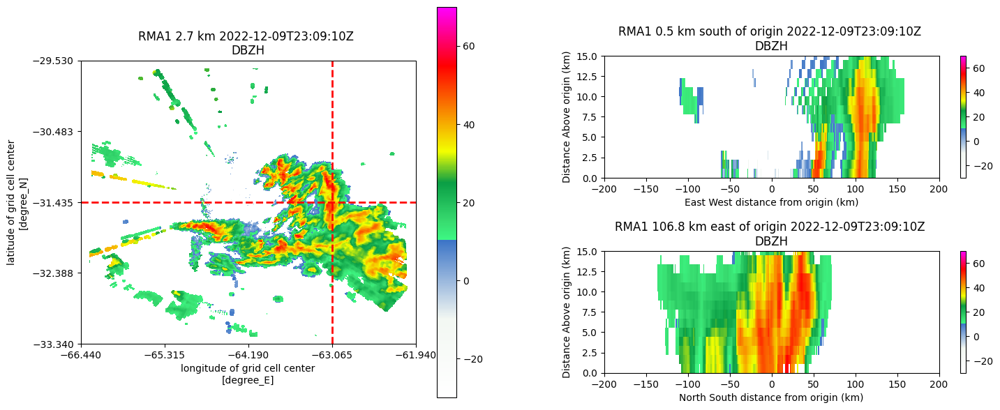

In [ ]:
# Parámetros configurables, min y max de la escala de colores, y coordenadas donde queremos realizar el corte
vmin = -30
vmax = 70
lat = -31.441
lon = -63.065

field = 'DBZH'

# Creamos objeto display a partir de la grilla anterior
display = pyart.graph.GridMapDisplay(grid)
# Creamos objeto figura
fig = plt.figure(figsize=[15, 7])
# Definimos los tamaños y ubicaciones de los gráficos
map_panel_axes = [0.05, 0.05, 0.4, 0.80]
x_cut_panel_axes = [0.55, 0.10, 0.4, 0.25]
y_cut_panel_axes = [0.55, 0.50, 0.4, 0.25]

# Panel 1: Gráfico PPI
ax1 = fig.add_axes(map_panel_axes, projection=projection)
display.plot_grid(field, 2, vmin=vmin, vmax=vmax, ax=ax1, projection=projection, cmap="grc_th")
display.plot_crosshairs(lon=lon, lat=lat)

# Panel 2: Corte longitudinal
ax2 = fig.add_axes(x_cut_panel_axes)
display.plot_longitude_slice(field, lon=lon, lat=lat, ax=ax2, vmin=vmin, vmax=vmax, cmap="grc_th")
# Límites x e y del corte
ax2.set_ylim([0, 15])
ax2.set_xlim([-200, 200])

# Panel 3: Corte latitudinal
ax3 = fig.add_axes(y_cut_panel_axes)
display.plot_latitude_slice(field, lon=lon, lat=lat, ax=ax3, vmin=vmin, vmax=vmax, cmap="grc_th")
# Límites x e y del corte
ax3.set_ylim([0, 15])
ax3.set_xlim([-200, 200])

plt.tight_layout()
plt.show()

## **Grafico CAPPI máximo**
Este gráfico nos da información del máximo en las tres direcciones x, y, z de la grilla.

*CAPPI = Constant Altitude Plan Position Indicator, en español Indicador de Plan de Posición de Constante Altitud.*

Documentación: https://arm-doe.github.io/pyart/examples/plotting/plot_max_cappi.html

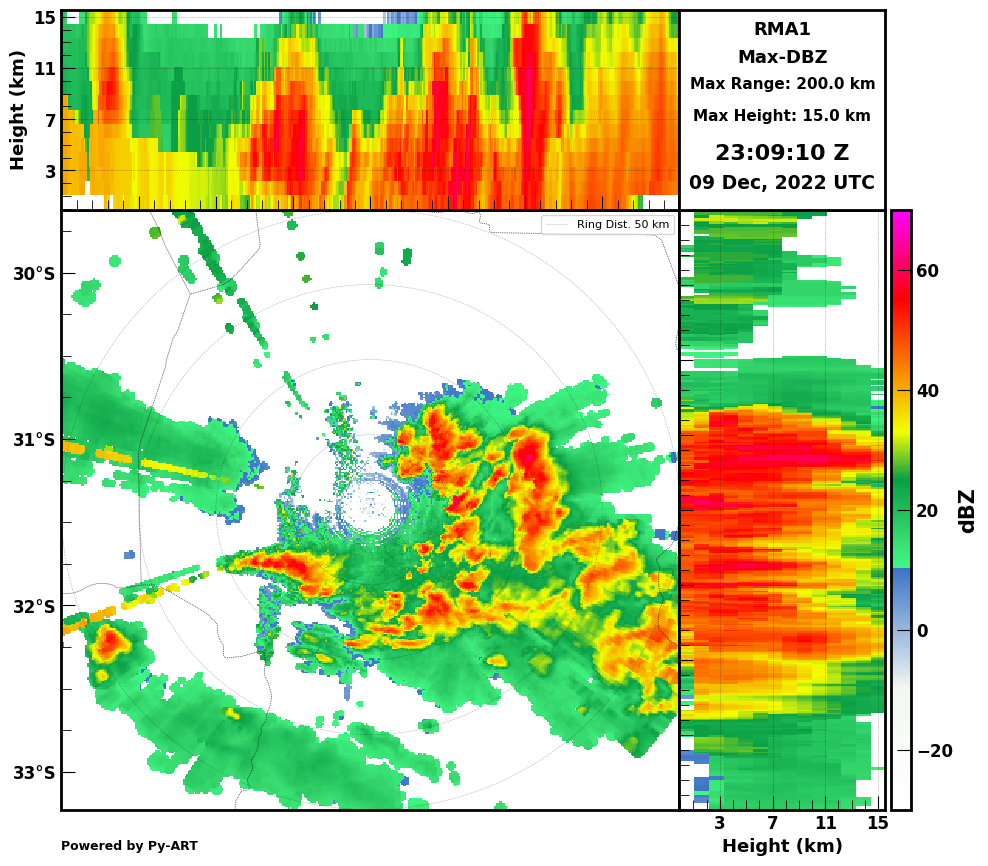

In [ ]:
display.plot_maxcappi(field='DBZH', range_rings=True, add_slogan=True, cmap="grc_th",
                      vmin=vmin, vmax=vmax, projection=projection)

## **Calculo del valor de una variable de radar sobre un punto en particular**


In [ ]:
# Funciones especificas para trabajar con datos de radar (funciones_radar.py debe estar en el mismo directorio que colores.py)
# de lo contrario debe especificarse el directorio
from funciones_radar import *

Usaremos la función:

**get_nearest_gate_azimuth(radar, longitud, latitud, verbose=False)**

donde radar es el volumen de **radar** (obj), **longitud** (float) y **latitud** (float) son las coordenadas geográficas de la ubicación que queremos extrear (en grados decimales) y **verbose** (bool) es un argumento que nos permite ver con mayor detalle los cálculos realizados por la función (es recomendable ponerlo en True y verificar los resultados).

Esta función nos retorna el **numero de gate** (int) y el **ángulo azimutal** (float) para las coordenadas solicitadas.

Por ejemplo, si quisieramos extraer el valor de factor de reflectividad sobre la localidad de **Río Primero**, cuyas coordenadas geográficas son:

**lat = -31.331574**

**lon = -63.624216**

In [ ]:
gate, alfa = get_nearest_gate_azimuth(radar, -63.624216, -31.331574, verbose=True)
print('\nSalida función: ',gate, alfa)

-----------------------------------------------
Angulo donde se ubica la estacion: 77.3873093228389 ° contando desde el norte geografico
El pluviometro esta a 55.25344170355973 km del radar
77 ° es el angulo redondeado
gate más cercano: 118
Coordenadas del centro del gate 118 con azimuth 77 :
Latidud     Longitud Altitud
-31.328423 -63.62572 1193.0
-----------------------------------------------

Salida función:  118 77


El numero de gate correspondientes es 118 y el ángulo azimutal es 77 grados

Extraemos el valor de las variables de radar sobre esa ubicación:

In [ ]:
radar.fields['DBZH']['data'][alfa,gate]

26.044716

In [ ]:
radar.fields['RHOHV']['data'][alfa,gate]

0.9884758

Verificamos que el resultado este bien:

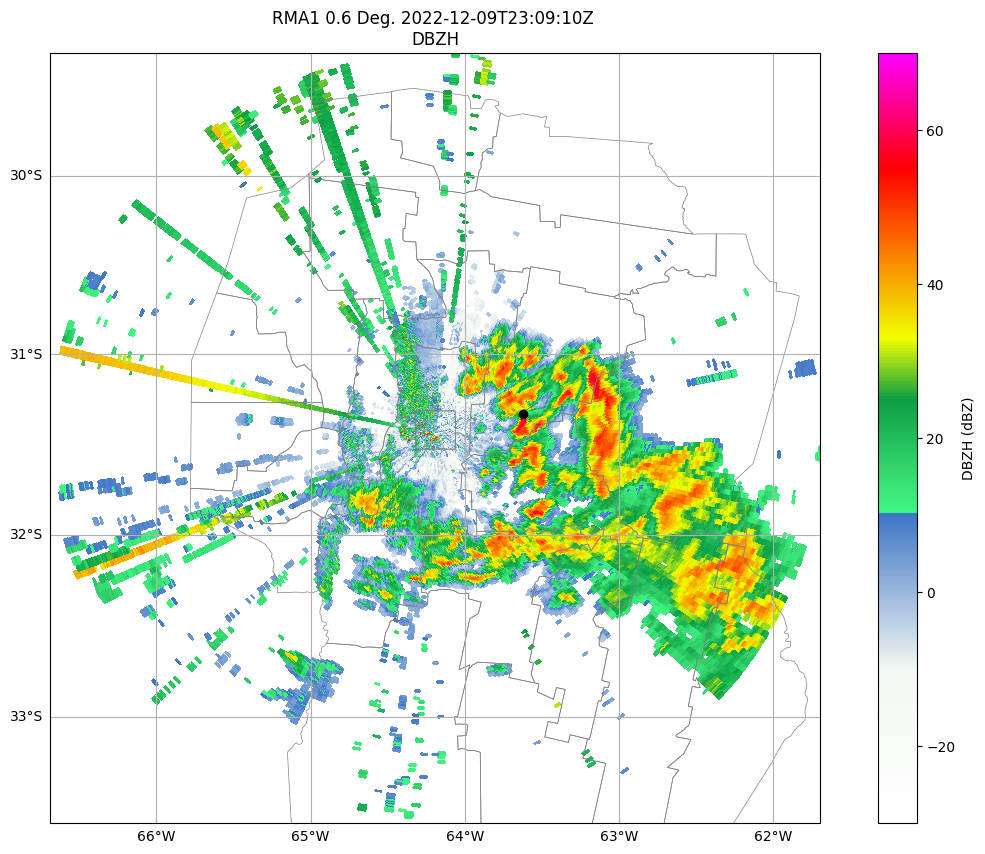

In [ ]:
# Creamos objeto figura y le asignamos un tamaño
fig = plt.figure(figsize=(15,10))
# Creamos un objeto display con los datos del volumen
display = pyart.graph.RadarMapDisplay(radar)

# Definimos la proyección con la que vamos a graficar
projection = ccrs.Mercator() # PlateCarree

# Grafico de DBZH
ax1 = plt.subplot(1,1,1, projection=projection)
display.plot_ppi_map(field='DBZH', sweep=0, vmin=-30, vmax=70,
                     cmap='grc_th', ax=ax1,
                     projection=projection,
                     lat_lines=[-30,-31,-32,-33],
                     lon_lines=[-62,-63,-64,-65,-66],
                     shapefile=path_shapes,
                     shapefile_kwargs={'zorder':1,'facecolor':'None', 'edgecolor':'grey', 'alpha':1,'lw':.5})

# Graficamos un punto de referencia en el mapa
display.plot_point(-63.624216, -31.331574, 'o', color='black')

**Hacemos zoom para ver mejor:**

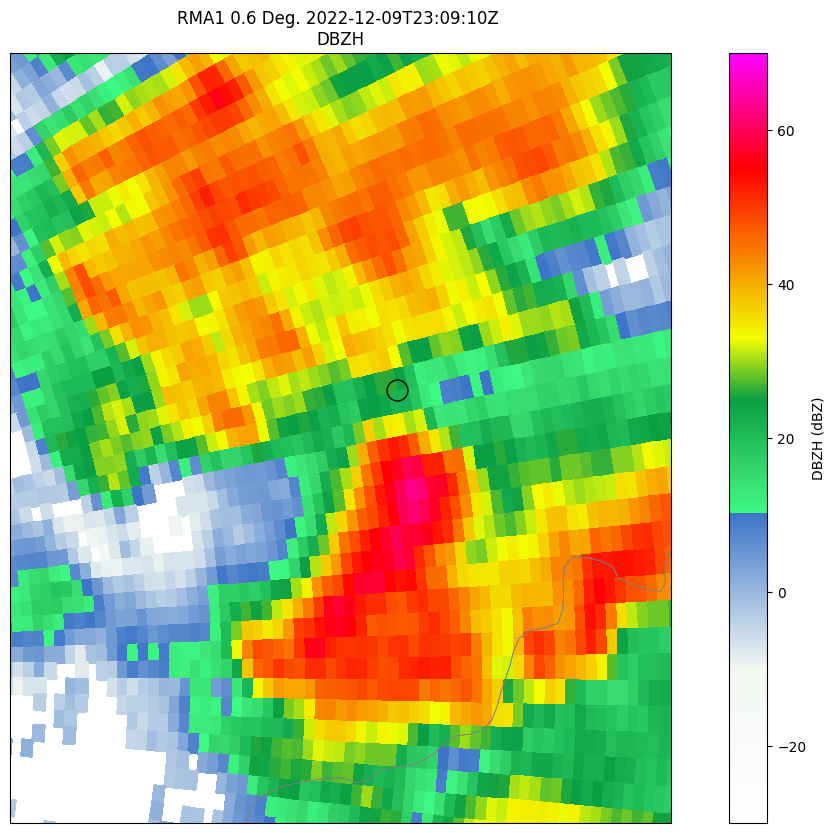

In [ ]:
# Región donde queremos hacer el zoom
# Latitud minima y máxima
min_lat=-31.5
max_lat=-31.2
# Longitud minima y máxima
min_lon=-63.8
max_lon=-63.5

# Creamos objeto figura y le asignamos un tamaño
fig = plt.figure(figsize=(15,10))
# Creamos un objeto display con los datos del volumen
display = pyart.graph.RadarMapDisplay(radar)

# Definimos la proyección con la que vamos a graficar
projection = ccrs.Mercator() # PlateCarree

# Grafico de DBZH
ax1 = plt.subplot(1,1,1, projection=projection)
display.plot_ppi_map(field='DBZH', sweep=0, vmin=-30, vmax=70,
                     cmap='grc_th', ax=ax1,
                     projection=projection,
                     lat_lines=[-30,-31,-32,-33],
                     lon_lines=[-62,-63,-64,-65,-66],
                     min_lon=min_lon, max_lon=max_lon,
                     min_lat=min_lat, max_lat=max_lat,
                     shapefile=path_shapes,
                     shapefile_kwargs={'zorder':1,'facecolor':'None', 'edgecolor':'grey', 'alpha':1,'lw':.5})

# Graficamos un punto de referencia en el mapa
display.plot_point(-63.624216, -31.331574, 'o',
                   markerfacecolor="None",
                   markeredgecolor='black',
                   ms=15)

## **La estimación de lluvia más común y básica se hace a través de relaciones Z-R. Este tipo de relaciones transforman el factor de reflectividad a tasa de precipitación.**


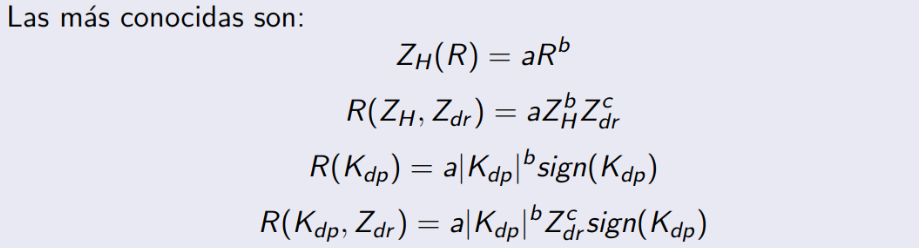

Battan en 1973 presentó una lista de 69 relaciones Z-R y Raghavan en 2013 otras 30.

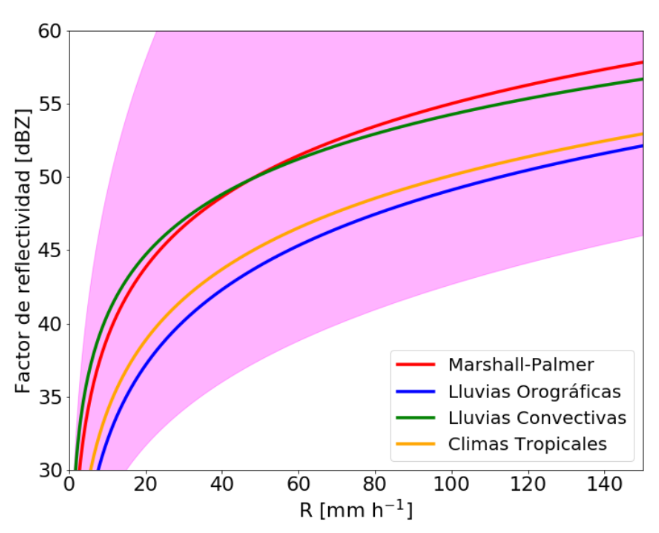

## **Calculo de un estimativo de la tasa de precipitación a partir del factor de reflectividad horizontal utilizando una relación de <font color='red'>Z-R</font> de Marshall y Palmer <font color='green'>$Z=200R^{1.6}$</font>**

### Nota: Z está en unidades lineales:
### $Z[dBZ] = log_{10}(Z[\frac{mm^{6}}{m^{3}}])$
### $Z[\frac{mm^{6}}{m^{3}}] = 10^{\frac{Z[dBZ]}{10}}$

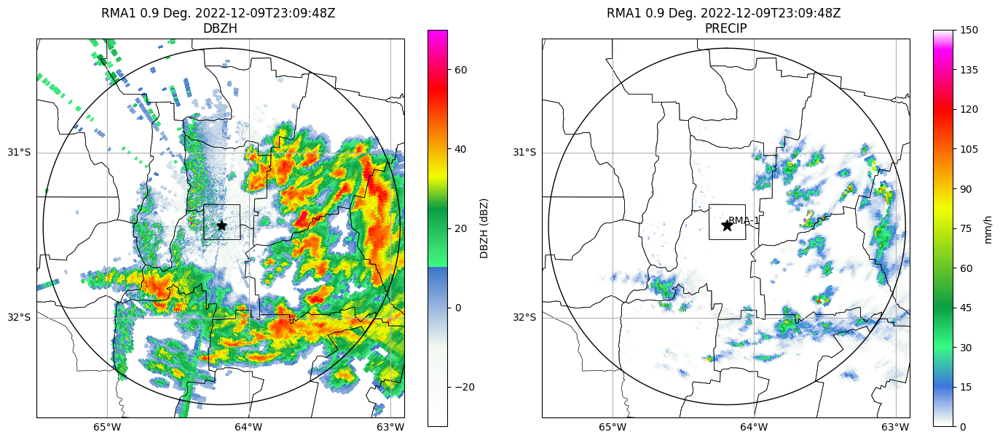

In [ ]:
##########################################################################################################################
##########################################################################################################################
# RHOHV limite a partir del cual se estima precipitacion
rho_lim = 0.9
# Elevación que queremos graficar (0 para elevacion mas baja)
elevacion = 1

# Configuramos ventana de visualizacion
min_lon=-65.5 # lado oeste
max_lon=-62.9 # lado este
min_lat=-32.6 # lado sur
max_lat=-30.3 # lado norte

# min_lon=-63.6
# max_lon=-62.9
# min_lat=-31.6
# max_lat=-30.9
##########################################################################################################################
##########################################################################################################################
# Maxima precipitación para la escala de colores
max_precip = 150

# Enmascaramos aquellos ecos no meteorologicos
filtered_field = np.ma.masked_where(radar.fields['RHOHV']['data'] < rho_lim, radar.fields['DBZH']['data'] )
# Pasamos el factor de reflectividad de dBZ a unidades lineales mm**6/m**3
linear_filtered_field = 10**(filtered_field/10)
# Calculamos la precipitación a traves de nuestra relación Z-R
precip_field = (linear_filtered_field/200)**(1/1.6)
# La agregamos al volumen como un campo mas
radar.add_field_like('DBZH', 'PRECIP', precip_field, replace_existing=True)
# Le declaramos las unidades
radar.fields['PRECIP']['units'] = 'mm/h'

# Creamos figura y objeto display
fig = plt.figure(figsize=[14,6])
display = pyart.graph.RadarMapDisplay(radar)

projection = ccrs.Mercator() #PlateCarree

# Grafico de DBZH

# ax1 = plt.subplot(1, 2, 1, projection=projection)
# display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
#                      projection=projection)

ax1 = plt.subplot(1, 2, 1, projection=projection)
display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
                     projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                     lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66],
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([120, 240], ax=None, lw=1)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', color='black', ms=10)

# Grafico de la PRECIPITACION

# ax2 = plt.subplot(1, 2, 2, projection = projection)
# display.plot_ppi_map('PRECIP', elevacion, vmin = 0, vmax = 50,
#                      cmap = 'grc_rain', ax=ax2,
#                      ticks=np.linspace(0,50,11), projection = projection,
#                      colorbar_flag=True, colorbar_label = 'mm/h')

ax2 = plt.subplot(1, 2, 2, projection = projection)
display.plot_ppi_map('PRECIP', elevacion, vmin = 0, vmax = max_precip, cmap = 'grc_rain', ax=ax2,
                     ticks=np.linspace(0,max_precip,11), projection = projection, lat_0 = radar.latitude['data'][0],
                     lon_0 = radar.longitude['data'][0],
                     shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                     colorbar_flag=True, colorbar_label = 'mm/h', lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66],
                     min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
# Graficamos circunferencias de radio (en km) definido en la lista
display.plot_range_rings([120], ax=None, lw=1)
# Graficamos un punto de referencia en el mapa
display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', 'RMA-1', color='black', ms=12)

plt.tight_layout()
plt.show()

## **Estimación de la precipitación acumulada durante el evento**



In [ ]:
##########################################################################################################################
##########################################################################################################################

# RHOHV limite a partir del cual se estima precipitacion
rho_lim = 0.9

# Elevación que queremos graficar (0 para elevacion mas baja)
elevacion = 1

##########################################################################################################################
##########################################################################################################################
# Maxima precipitación para la escala de colores
max_precip = 35

# Delta t para el cual se transforma tasa de precipitacion a precipitacion acumulada
delta_t = 10    # En minutos
projection = ccrs.Mercator() #PlateCarree

# Limpiamos el directorio por si llega a haber figuras de ejecuciones anteriores
!rm *.png
contador = 0
for filename in lista_de_archivos:
    try:
        # Comando de lectura
        radar = pyart.io.read(filename, include_fields=['DBZH','RHOHV'])
        # print('Procesando ',filename)

        # Filtro el campo segun un umbral en RHOHV
        filtered_field = np.ma.masked_where(radar.fields['RHOHV']['data'] < rho_lim, radar.fields['DBZH']['data'] )
        filtered_field = filtered_field.filled(fill_value=-30)

        min_lon=radar.longitude['data'][0]-1.4
        max_lon=radar.longitude['data'][0]+1.4
        min_lat=radar.latitude['data'][0]-1.4
        max_lat=radar.latitude['data'][0]+1.4
    except:
        continue

    # Convierto la reflectivdad en mm**6/mm**3
    linear_filtered_field = 10**(filtered_field/10)
    # Calculo la tasa de precipitacion en mm/h
    temp_precip = (linear_filtered_field/200)**(1/1.6)
    # Calculo la precipitacion acumulada en un periodo delta t
    temp_precip = temp_precip*delta_t/60

    if filename == lista_de_archivos[0]:
        precip_field = temp_precip.copy()
    else:
        # Calculo el acumulado
        precip_field = temp_precip+precip_field

    # print(precip_field[100,25:30])
    # Agrego el nuevo campo al objeto radar
    radar.add_field_like('DBZH', 'PRECIP', precip_field, replace_existing=True)
    # Le doy las unidades correspondientes
    radar.fields['PRECIP']['units'] = 'mm'

    display = pyart.graph.RadarMapDisplay(radar)

    # Figura a crear, de proporciones pulgadas ancho x pulgadas alto, modo ajustado.
    fig = plt.figure(figsize=[11,5], tight_layout=True)

    # Grafico de DBZH
    ax1 = plt.subplot(1, 2, 1, projection=projection)
    display.plot_ppi_map('DBZH', elevacion, vmin = -30, vmax = 70, cmap='grc_th', ax=ax1,
                         projection=projection, lat_0=radar.latitude['data'][0], lon_0=radar.longitude['data'][0],
                         lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66],
                         shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                         min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)
    # Graficamos circunferencias de radio (en km) definido en la lista
    display.plot_range_rings([60, 120], ax=None, lw=1, ls='--')
    # Graficamos un punto de referencia en el mapa
    display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', 'RMA-1',
                       color='black', ms=15, label_offset=(0.08, 0.08))

    # Grafico de PRECIPITACION
    ax2 = fig.add_subplot(1, 2, 2, projection=projection)
    display.plot_ppi_map('PRECIP', elevacion, vmin = 0, vmax = max_precip, cmap = 'grc_rain', ax = ax2,
                         ticks=np.linspace(0,max_precip,11), resolution='10m',
                         projection = projection, lat_0 = radar.latitude['data'][0],
                         lon_0 = radar.longitude['data'][0],
                         shapefile=path_shapes, shapefile_kwargs=shapes_kwargs,
                         alpha = 1, colorbar_flag=True,
                         colorbar_label = 'mm', lat_lines=[-30,-31,-32,-33], lon_lines=[-62,-63,-64,-65,-66],
                         min_lon=min_lon, max_lon=max_lon, min_lat=min_lat, max_lat=max_lat)

    # Graficamos circunferencias de radio (en km) definido en la lista
    display.plot_range_rings([60,120], ax=None, lw=1, ls='--')
    # Graficamos un punto de referencia en el mapa
    display.plot_point(radar.longitude['data'][0], radar.latitude['data'][0], '*', 'RMA-1',
                       color='black', ms=15, label_offset=(0.08, 0.08))

    plt.tight_layout()
    plt.savefig('figura_'+str(contador)+'.png', bbox_inches='tight', dpi=100)
    plt.show()
    contador = contador + 1

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# creamos una lista vacia para guardar nuestras figuras
lista_figuras = []
# listamos todos los archivos en el directorio temporal de colab
lista_archivos = os.listdir()
# iteramos por cada archivo y verificamos que termine en .png
for archivo in lista_archivos:
  if archivo.split('.')[-1] == 'png':
    lista_figuras.append(archivo)

# ordenamos la lista
lista_figuras.sort()
lista_figuras

['figura_0.png',
 'figura_1.png',
 'figura_2.png',
 'figura_3.png',
 'figura_4.png',
 'figura_5.png',
 'figura_6.png',
 'figura_7.png']

In [ ]:
# Interfaz de Python para leer y escribir imagenes
import imageio.v2 as imageio
from IPython.display import Image

# Creamos el .GIF
images = []
for figura in lista_figuras:
    images.append(imageio.imread(figura))
imageio.mimsave('animacion.gif', images, fps=1)

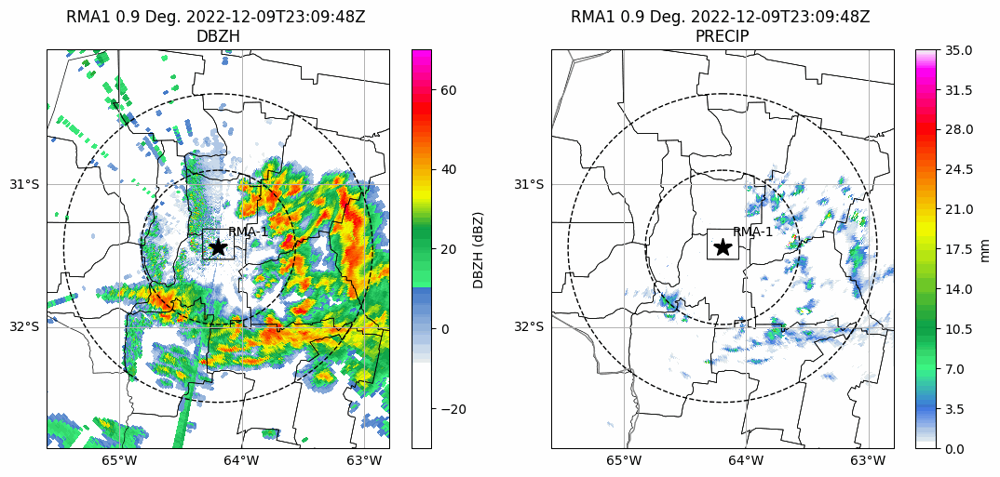

In [ ]:
# Abrimos el .GIF
Image(open('animacion.gif','rb').read())

## **Extracción de la serie temporal de estimación de precipitación sobre un punto**


In [ ]:
# Elegimos un punto, por ejemplo la localidad de Arroyito
latitud  = -31.4229314
longitud = -63.0534119

gate, alfa = get_nearest_gate_azimuth(radar, longitud, latitud, verbose=True)

-----------------------------------------------
Angulo donde se ubica la estacion: 89.21187957795475 ° contando desde el norte geografico
El pluviometro esta a 108.03822523431296 km del radar
89 ° es el angulo redondeado
gate más cercano: 236
Coordenadas del centro del gate 236 con azimuth 89 :
Latidud     Longitud Altitud
-31.419281 -63.051018 2213.0
-----------------------------------------------


In [ ]:
# Importamos pandas para guardar la serie temporal
import pandas as pd
# Importamos libreria para trabajar con series temporales
from datetime import datetime

# Iteramos sobre todos los volumenes de radar

# RHOHV limite a partir del cual se estima precipitacion
rho_lim = 0.8

# Delta t para el cual se transforma tasa de precipitacion a precipitacion acumulada
delta_t = 10

# Inicializamos una variable para calcular la precipitacion acumulada
acc_precip = 0

# Inicializamos un DataFrame para la serie extraida
serie = pd.DataFrame()

for filename in lista_de_archivos:
    try:
        # Comando de lectura
        radar = pyart.io.read(filename, include_fields=['DBZH','RHOHV'])

        # Filtro el campo segun un umbral en RHOHV
        filtered_value = np.ma.masked_where(radar.fields['RHOHV']['data'][alfa,gate] < rho_lim, radar.fields['DBZH']['data'][alfa,gate] )
        filtered_value = filtered_value.filled(fill_value=-30)

        # Extraemos valor de DBZH y RHOHV sobre el punto geografico
        rhohv_value = radar.fields['RHOHV']['data'][alfa,gate]
        dbzh_value  = radar.fields['DBZH']['data'][alfa,gate]

        # Convierto la reflectivdad en mm**6/mm**3
        linear_filtered_value = 10**(filtered_value/10)
        # Calculo la tasa de precipitacion en mm/h
        temp_precip = (linear_filtered_value/200)**(1/1.6)
        # Calculo la precipitacion acumulada en un periodo delta t y sumamos
        acc_precip = acc_precip + temp_precip*delta_t/60

        # Extraemos la fecha y hora del volumen de radar
        datetime_object = datetime.strptime(radar.time['initial_sweep_time'][0],
                                            '%Y%m%dT%H%M%S')

        # Creamos dataframe temporal para guardar los resultados
        temp_df = pd.DataFrame({'DBZH'     : [dbzh_value],
                               'RHOHV'     : [rhohv_value],
                               'RAINRATE'  : [temp_precip],
                               'ACUMULADO' : [acc_precip]},
                               index       = [datetime_object])

        serie = pd.concat([serie,temp_df])

    except Exception as error:
        print('Ocurrió un error! ',error)
        continue

In [ ]:
# Nos fijamos en la serie
serie

,DBZH,RHOHV,RAINRATE,ACUMULADO
2022-12-09 23:08:32,41.779263,0.874438,14.895674,2.482612
2022-12-09 23:21:32,33.410805,0.959476,4.467160,3.227139
2022-12-09 23:34:33,20.628300,0.983973,0.709782,3.345436
2022-12-09 23:59:33,13.592217,0.849136,0.257852,3.388411
2022-12-10 00:12:31,5.665106,0.502258,0.000486,3.388492
2022-12-10 00:25:29,46.141369,0.978189,27.905628,8.039430
2022-12-10 00:38:29,34.632935,0.986881,5.326166,8.927125
2022-12-10 00:51:32,32.799061,0.980170,4.090699,9.608908


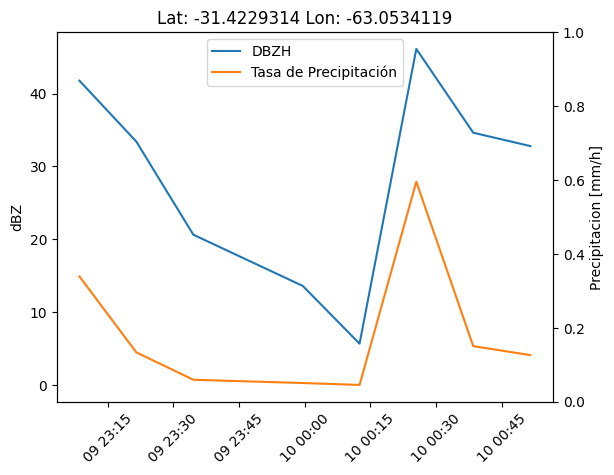

In [ ]:
# Graficamos nuestros resultados
plt.plot(serie.index, serie['DBZH'], label='DBZH')
plt.plot(serie.index, serie['RAINRATE'], label='Tasa de Precipitación')

plt.legend()
plt.xticks(rotation=45)
plt.ylabel('dBZ')
plt.title('Lat: '+str(latitud)+' Lon: '+str(longitud))

ax = plt.gca().twinx()
ax.set_ylabel("Precipitacion [mm/h]")

plt.show()

In [ ]:
# Podemos exportar la serie anterior a un archivo .csv
serie.to_csv('serie_radar.csv')

## **Grafico de una variable en función del rango**

Documentación: https://arm-doe.github.io/pyart/API/generated/pyart.graph.RadarDisplay.plot_ray.html


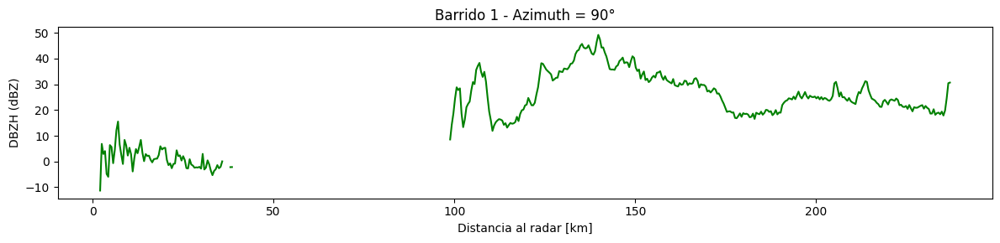

In [ ]:
display = pyart.graph.RadarDisplay(radar)

# Barrido de interés
sweep = 1
# ángulo contando en sentido horario desde el norte
angulo = 90

# Campo a graficar
campo = 'DBZH'
# rayo es el ángulo más el barrido por el entero sweep que representa la elevación
rayo = angulo + sweep*360

# Figura a crear, de proporciones pulgadas ancho x pulgadas alto, modo ajustado.
fig= plt.figure(figsize=[12,3], tight_layout=True)
display.plot_ray(campo, rayo, format_str='g-', title=f'Barrido {sweep} - Azimuth = {angulo}°', fig=fig)

plt.xlabel('Distancia al radar [km]')
plt.show()

## **Extracción del perfil vertical sobre un punto**

Documentación: https://arm-doe.github.io/pyart-docs-travis/API/generated/pyart.graph.RadarMapDisplay.plot_point.html

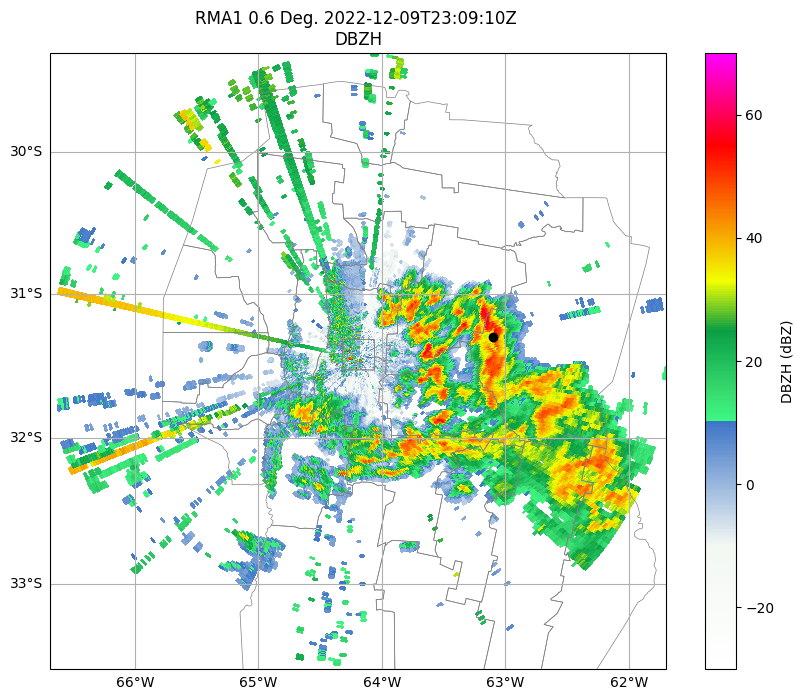

In [ ]:
site_lon = -63.1  # longitude in degrees
site_lat = -31.3  # latitdue in degrees

# site_lon = -64.1564  # longitude in degrees
# site_lat = -31.3919  # latitdue in degrees

# Linea para la apertura del archivo o volumen de radar
radar = pyart.io.read(lista_de_archivos[0])

# Indicar en donde están nuestros shapefiles
# path_shapes = '/content/drive/MyDrive/Curso-Radar/Shapes/cba_deptos.shp'
path_shapes = './Shapes/cba_deptos.shp'
shapes_kwargs = {'zorder':1,'facecolor':'None', 'edgecolor':'black', 'alpha':1,'lw':.5}
projection = ccrs.Mercator() #PlateCarree

# Creamos objeto figura y le asignamos un tamaño
fig = plt.figure(figsize=(10,8))
# Creamos un objeto display con los datos del volumen
display = pyart.graph.RadarMapDisplay(radar)

# Grafico de DBZH
ax1 = plt.subplot(1,1,1, projection=projection)
display.plot_ppi_map(field='DBZH', sweep=0, vmin=-30, vmax=70,
                     cmap='grc_th', ax=ax1,
                     projection=projection,
                     lat_lines=[-30,-31,-32,-33],
                     lon_lines=[-62,-63,-64,-65,-66],
                     shapefile=path_shapes,
                     shapefile_kwargs={'zorder':1,'facecolor':'None', 'edgecolor':'grey', 'alpha':1,'lw':.5})

# Graficamos un punto de referencia en el mapa
display.plot_point(site_lon, site_lat, 'o', color='black')

In [ ]:
ds = pyart.util.columnsect.get_field_location(radar, site_lat, site_lon)
print(ds)

<xarray.Dataset> Size: 1kB
Dimensions:      (height: 15)
Coordinates:
  * height       (height) float64 120B 2.124e+03 2.834e+03 ... 6.188e+04
Data variables:
    WRAD         (height) float64 120B 2.269 2.517 1.928 1.33 ... nan nan nan
    KDP          (height) float64 120B 0.9182 nan nan nan ... nan nan nan nan
    DBZV         (height) float64 120B 33.71 35.61 36.45 34.23 ... nan nan nan
    DBZH         (height) float64 120B 32.33 35.37 35.96 33.63 ... nan nan nan
    ZDR          (height) float64 120B -1.38 -0.2395 -0.4882 ... nan nan nan
    VRAD         (height) float64 120B -4.034 -1.028 -2.069 ... nan nan nan
    RHOHV        (height) float32 60B 0.9764 0.9811 0.9864 ... 0.2233 0.2348
    PHIDP        (height) float32 60B 53.22 37.91 33.42 ... 61.43 35.72 28.23
    base_time    datetime64[ns] 8B 2022-12-09T23:09:10
    time_offset  (height) datetime64[ns] 120B 2022-12-09T23:09:18.655555556 ....
Attributes:
    distance_from_radar:    104.851 km
    azimuth:                81.6

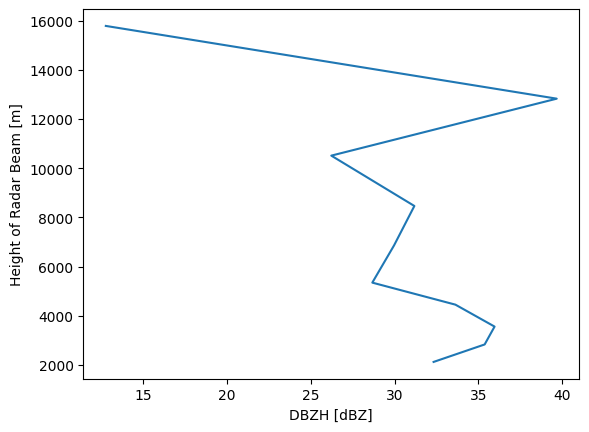

In [ ]:
ds.DBZH.plot(y="height")

# *Contacto: matias.suarez@unc.edu.ar*

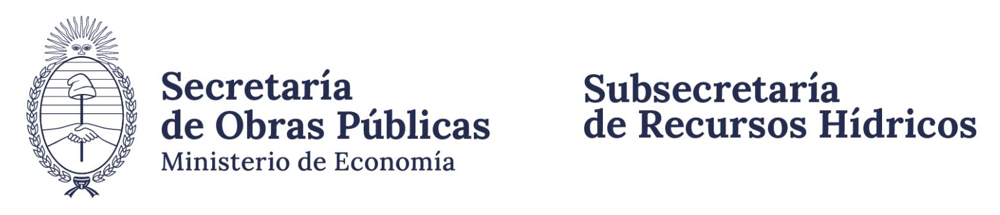

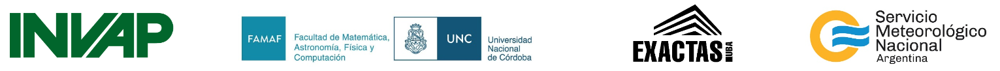